In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/heart-disease/dataset.csv


In [2]:
pip install --upgrade scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 54.2 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
category-encoders 2.7.0 requires scikit-learn<1.6.0,>=1.0.0, but you have scikit-learn 1.7.2 which is incompatible.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.7.2 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [4]:
data = pd.read_csv('/kaggle/input/heart-disease/dataset.csv')

In [5]:
data.head()

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  1190 non-null   int64  
 1   sex                  1190 non-null   int64  
 2   chest pain type      1190 non-null   int64  
 3   resting bp s         1190 non-null   int64  
 4   cholesterol          1190 non-null   int64  
 5   fasting blood sugar  1190 non-null   int64  
 6   resting ecg          1190 non-null   int64  
 7   max heart rate       1190 non-null   int64  
 8   exercise angina      1190 non-null   int64  
 9   oldpeak              1190 non-null   float64
 10  ST slope             1190 non-null   int64  
 11  target               1190 non-null   int64  
dtypes: float64(1), int64(11)
memory usage: 111.7 KB


In [7]:
data.describe()

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
count,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000
mean,53.720168,0.763866,3.232773,132.153782,210.363866,0.213445,0.698319,139.732773,0.387395,0.922773,1.624370,0.528571
std,9.358203,0.424884,0.935480,18.368823,101.420489,0.409912,0.870359,25.517636,0.487360,1.086337,0.610459,0.499393
min,28.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,60.000000,0.000000,-2.600000,0.000000,0.000000
25%,47.000000,1.000000,3.000000,120.000000,188.000000,0.000000,0.000000,121.000000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,4.000000,130.000000,229.000000,0.000000,0.000000,140.500000,0.000000,0.600000,2.000000,1.000000
75%,60.000000,1.000000,4.000000,140.000000,269.750000,0.000000,2.000000,160.000000,1.000000,1.600000,2.000000,1.000000
max,77.000000,1.000000,4.000000,200.000000,603.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,1.000000


In [8]:
data.shape

(1190, 12)

In [9]:
print(data.isnull().sum())

age                    0
sex                    0
chest pain type        0
resting bp s           0
cholesterol            0
fasting blood sugar    0
resting ecg            0
max heart rate         0
exercise angina        0
oldpeak                0
ST slope               0
target                 0
dtype: int64


In [10]:
data.duplicated().sum()

272

In [11]:
data['target'].value_counts()

target
1    629
0    561
Name: count, dtype: int64

In [12]:
data = data.dropna()   # or fillna(df.mean()) if few missing values

In [13]:
data.select_dtypes(include=['object']).columns.tolist()

[]

In [14]:
# Loop through all columns except 'target'
for col in data.columns:
    if col == 'target':
        continue  # skip target column
    
    # Skip columns with too many unique values (optional)
    # You can comment this out if you want to include all numeric columns
    if data[col].nunique() > 20:
        continue  
    
    # Total patients per category/value
    obs = data[col].value_counts().sort_index()

    # Proportion of Heart Disease = 1 in each category/value
    avg_hd = (
        data.groupby(col)['target']
        .mean()
        .mul(100)
        .round(1)
    )

    # Combine results
    result = pd.DataFrame({
        "Total Patients": obs,
        "Proportion of Heart Disease (%)": avg_hd
    }).sort_values("Proportion of Heart Disease (%)", ascending=False)

    # Styled table
    styled = (
        result.style
        .set_caption(f'Variable: {col}')
        .format({"Proportion of Heart Disease (%)": "{:,.1f}%"})
        .highlight_max(
            subset=["Proportion of Heart Disease (%)"],
            props='font-weight:bold; color:white; background-color:#6099AB;'
        )
    )

    display(styled)

,Total Patients,Proportion of Heart Disease (%)
sex,,
1,909,61.5%
0,281,24.9%


,Total Patients,Proportion of Heart Disease (%)
chest pain type,,
4,625,77.3%
1,66,37.9%
3,283,31.8%
2,216,14.4%


,Total Patients,Proportion of Heart Disease (%)
fasting blood sugar,,
1,254,73.6%
0,936,47.2%


,Total Patients,Proportion of Heart Disease (%)
resting ecg,,
1,181,65.7%
2,325,55.1%
0,684,48.4%


,Total Patients,Proportion of Heart Disease (%)
exercise angina,,
1,461,83.1%
0,729,33.7%


,Total Patients,Proportion of Heart Disease (%)
ST slope,,
0,1,100.0%
2,582,78.9%
3,81,72.8%
1,526,20.9%


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

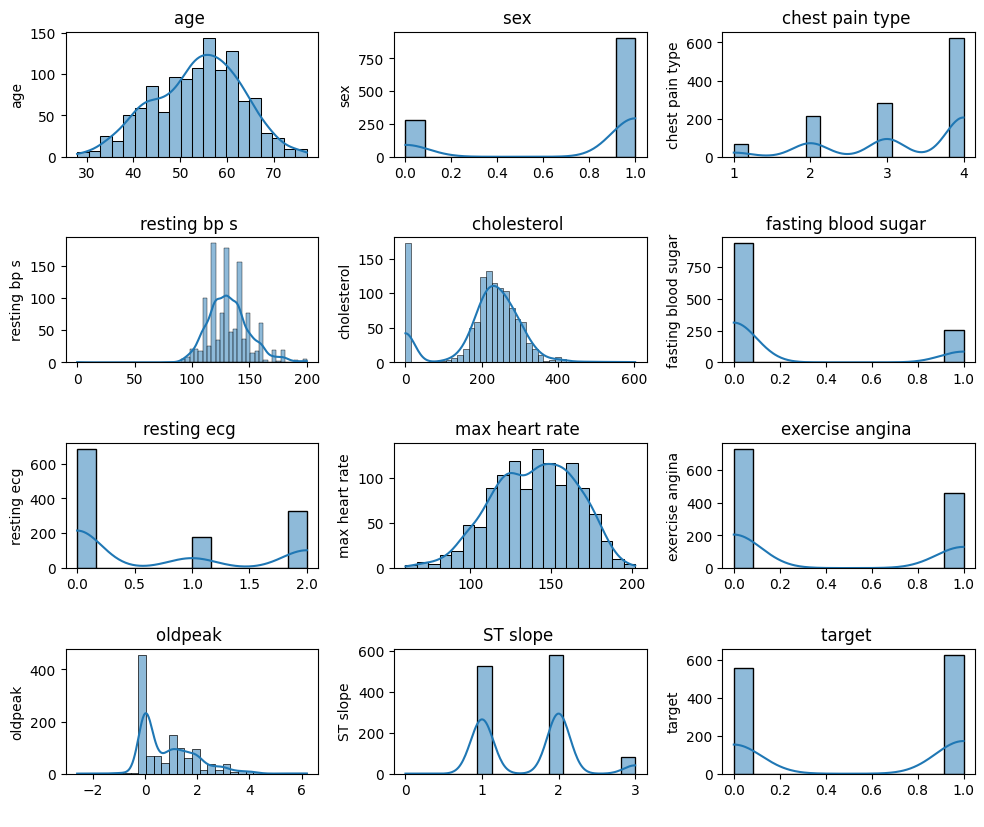

In [15]:
plt.figure(figsize=(10, 10))
for i, feature in enumerate(data.columns):
    plt.subplot(5, 3, i+1)
    sns.histplot(data=data, x=feature, kde=True)
    plt.title(f'{feature} ')
    plt.xlabel(' ')
    plt.ylabel(feature)
plt.tight_layout()

plt.show();

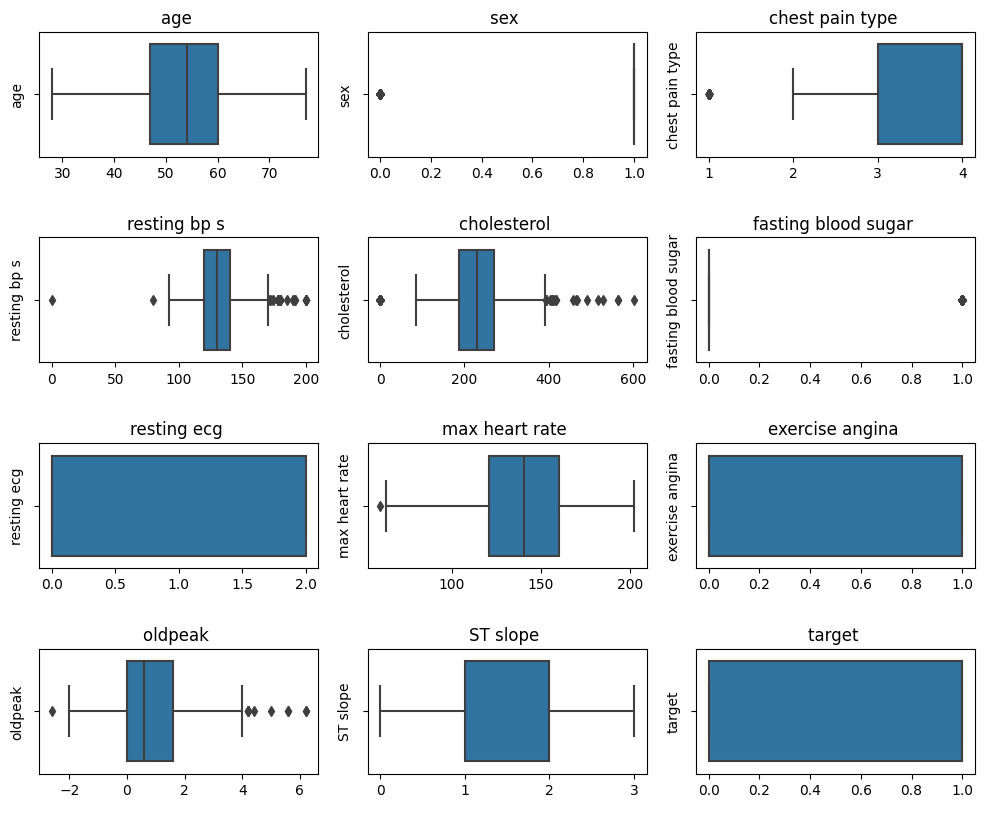

In [16]:
plt.figure(figsize=(10, 10))
for i, feature in enumerate(data.columns):
    plt.subplot(5, 3, i+1)
    sns.boxplot(data=data, x=feature)
    plt.title(f'{feature} ')
    plt.xlabel(' ')
    plt.ylabel(feature)
plt.tight_layout()

plt.show();

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

<Figure size 1000x1000 with 0 Axes>

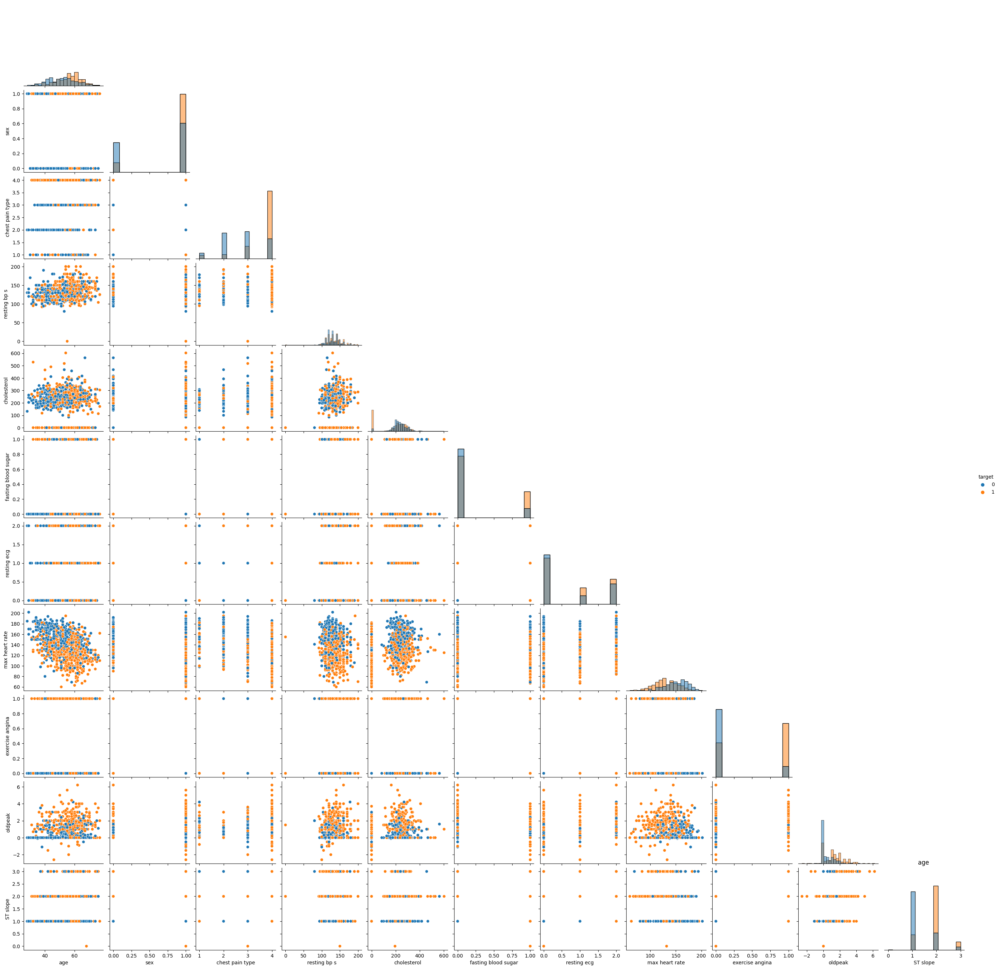

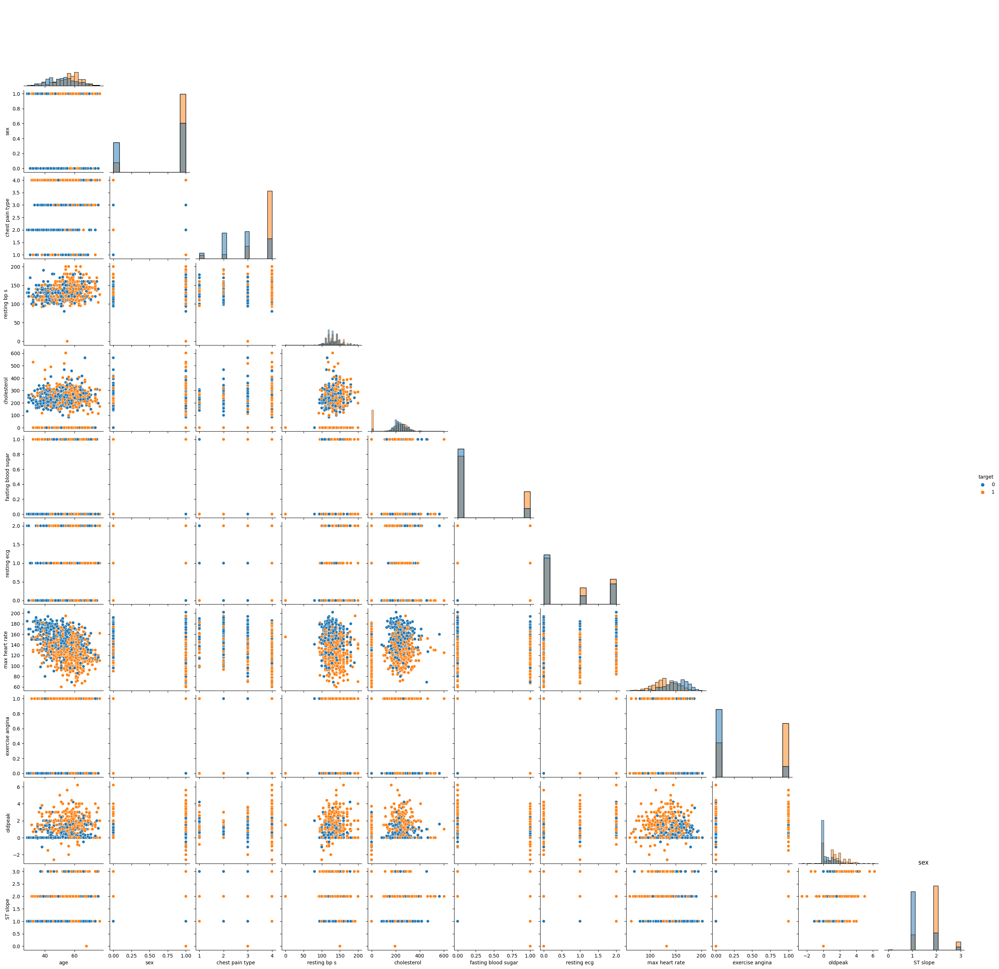

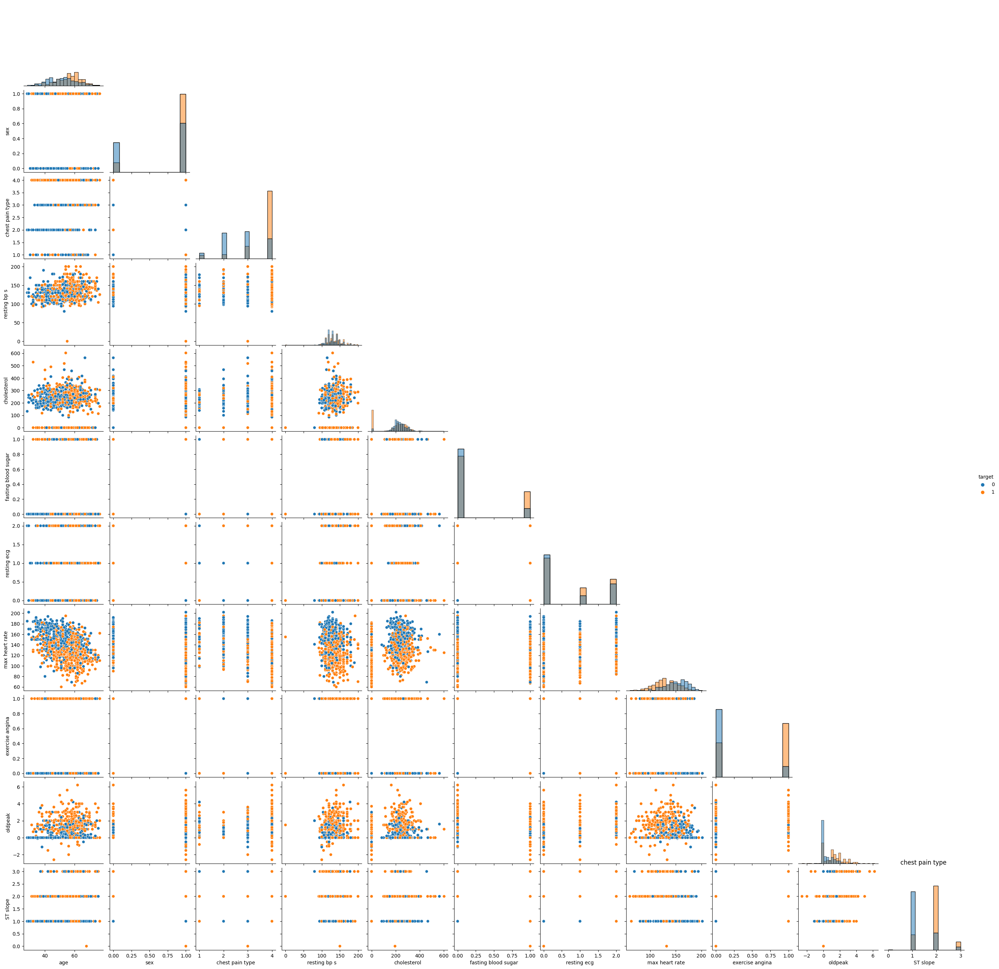

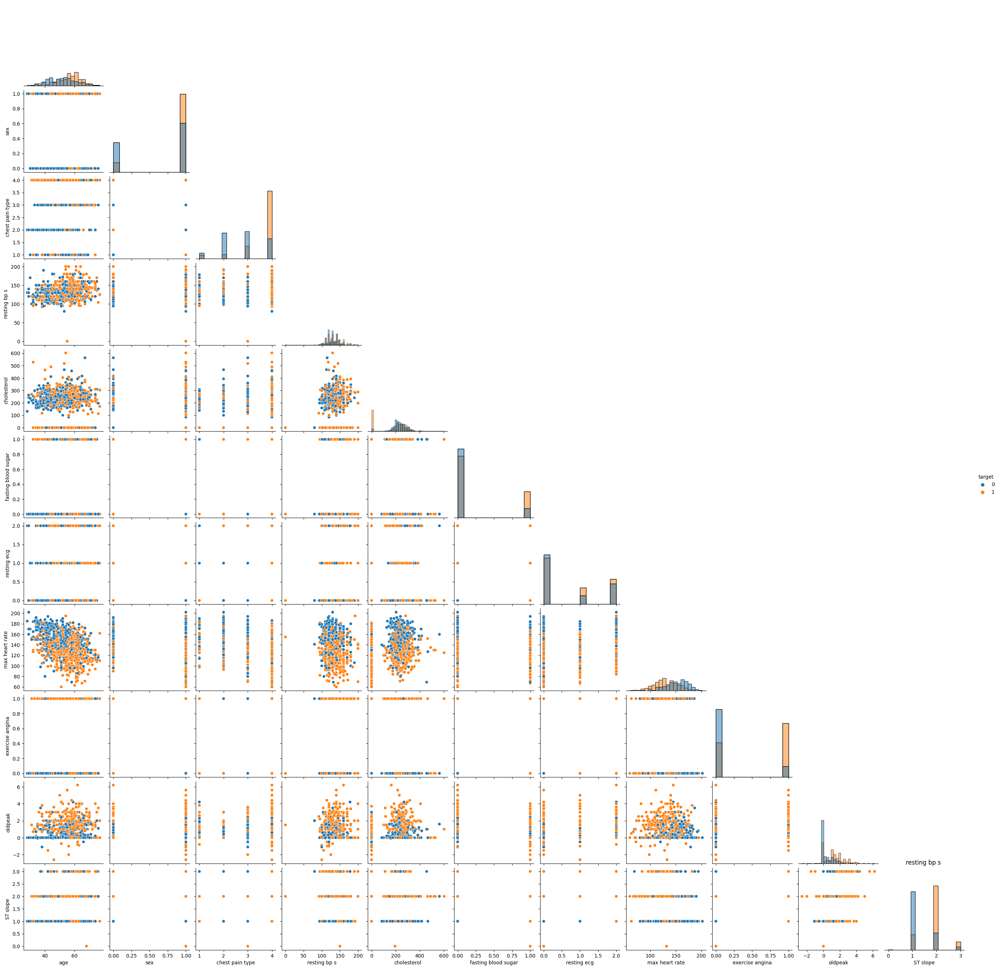

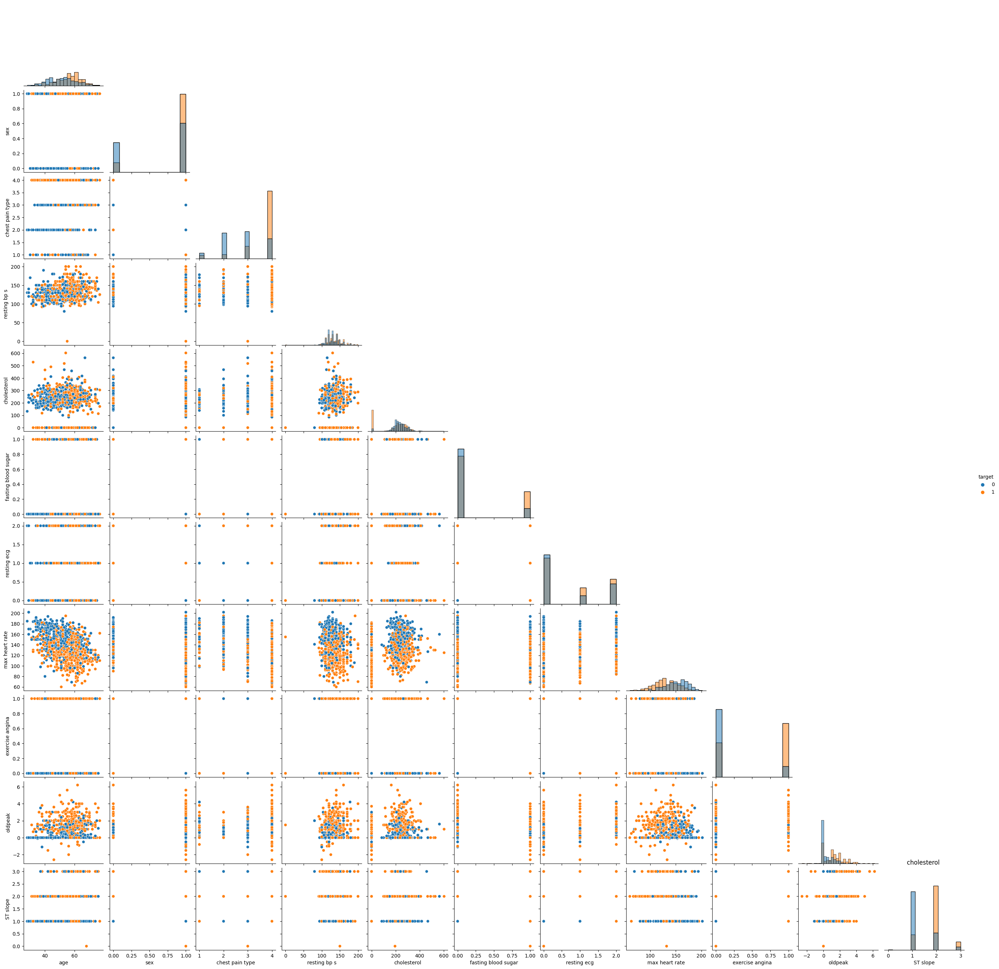

...

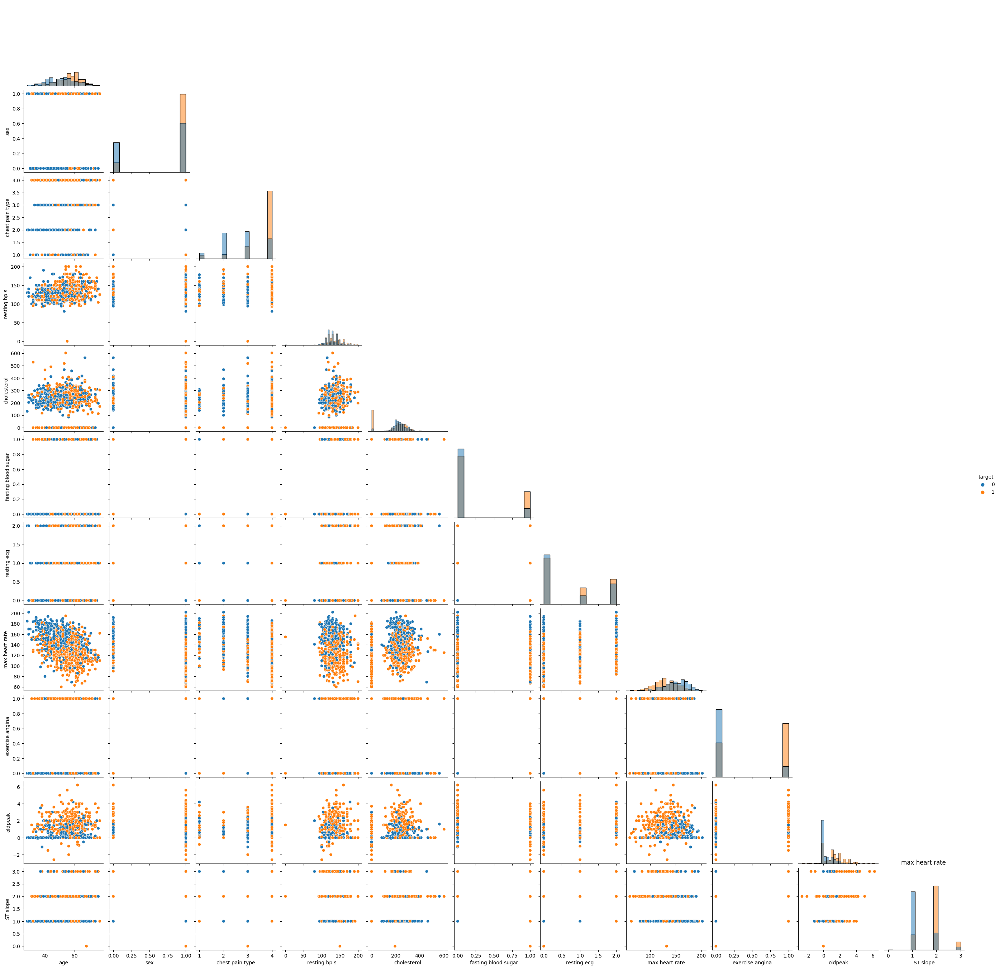

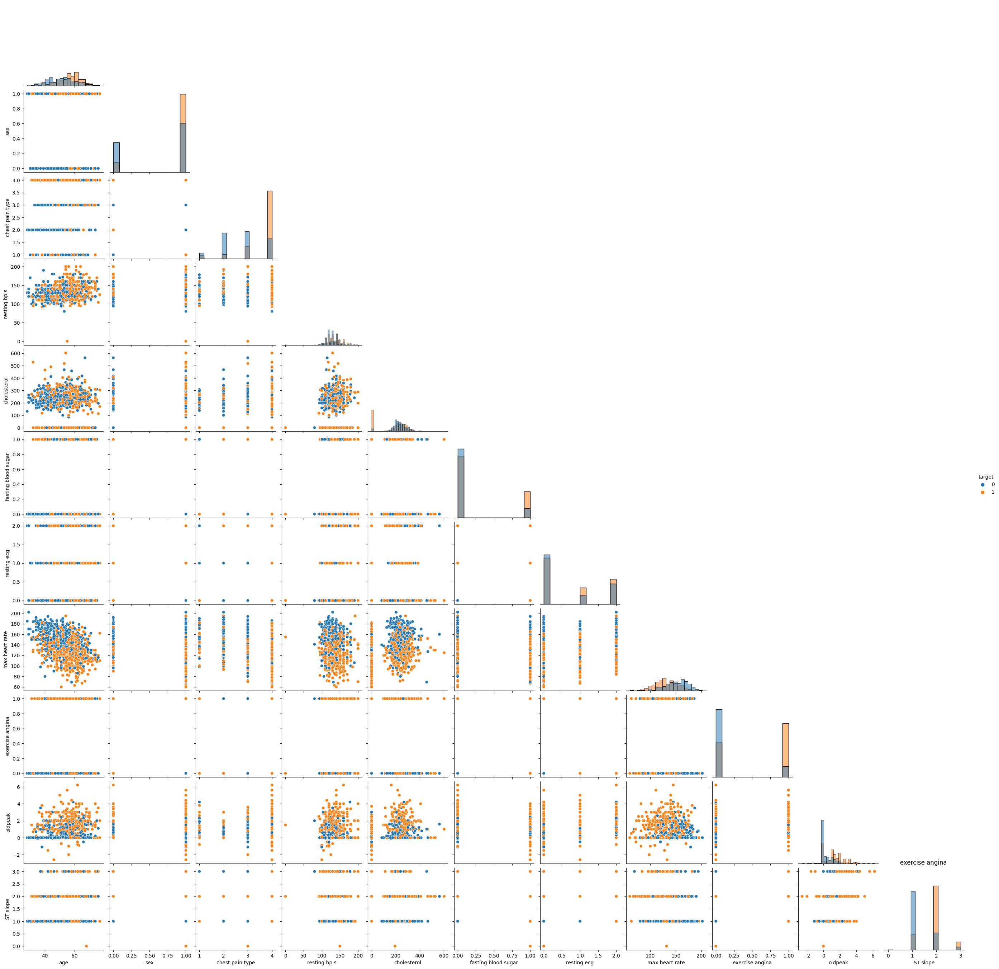

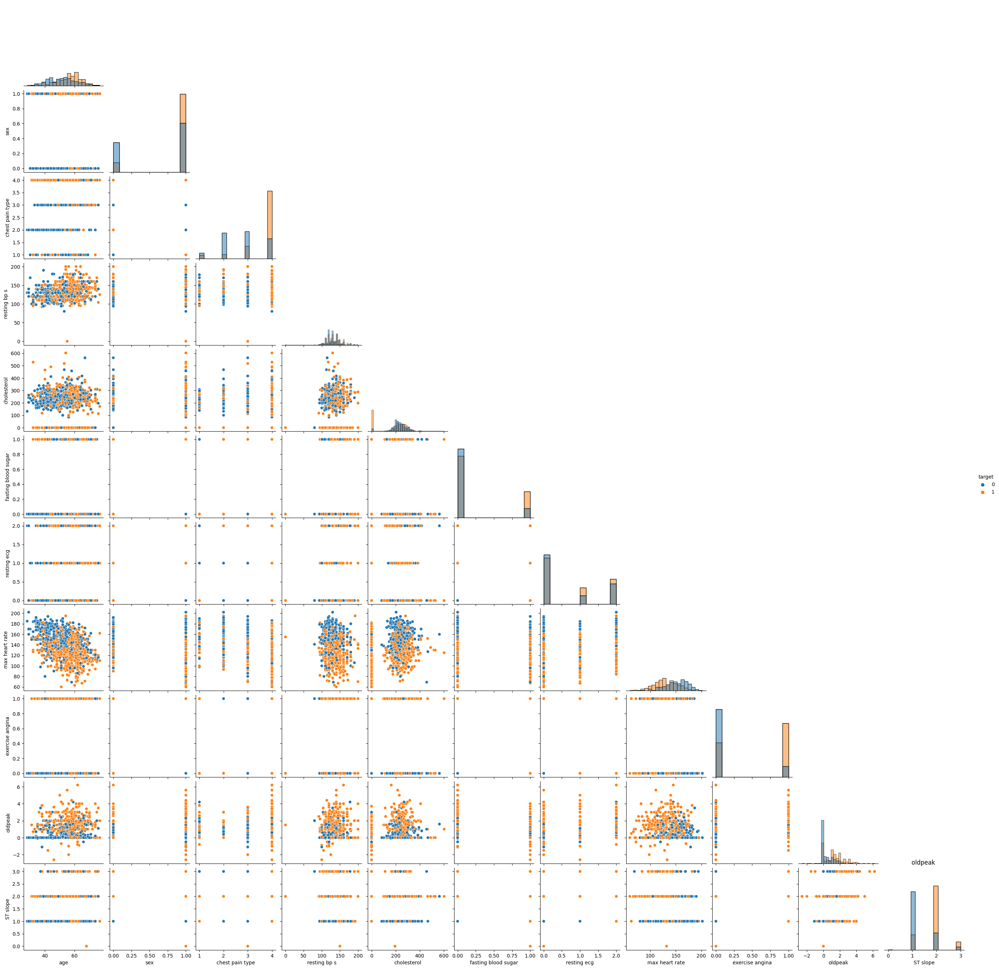

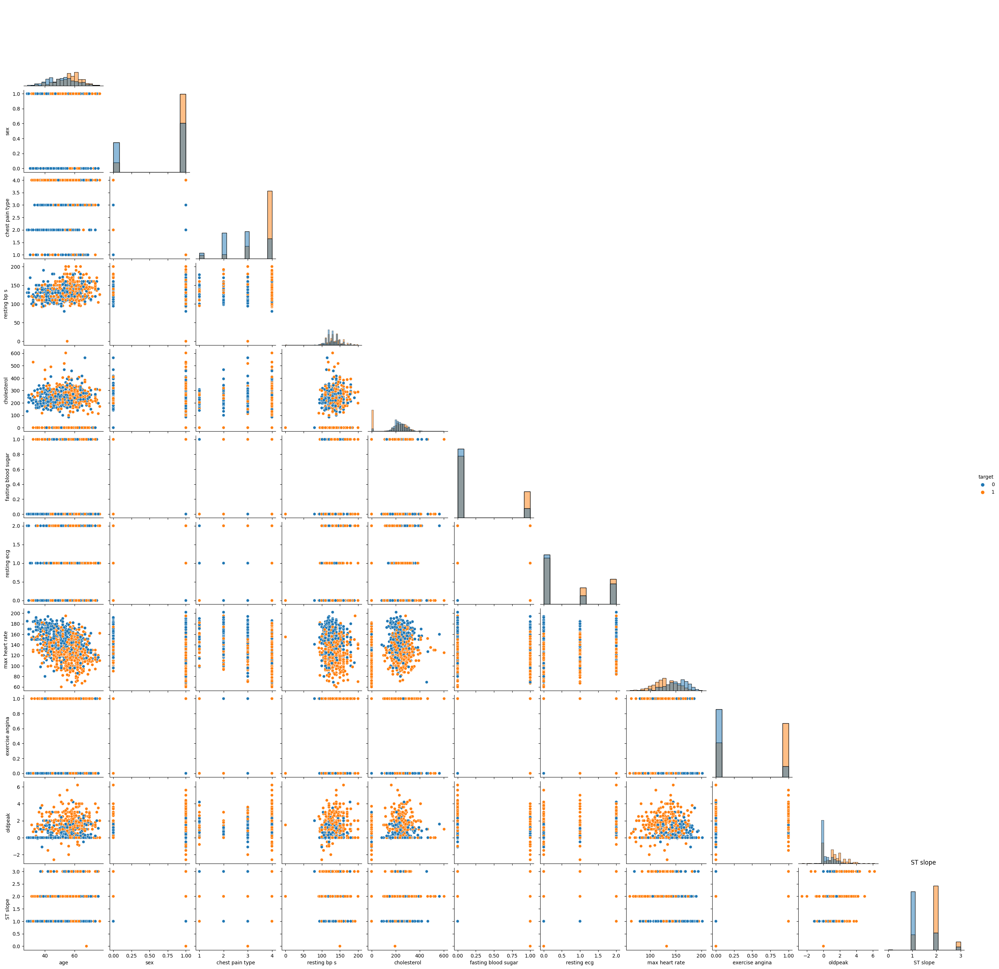

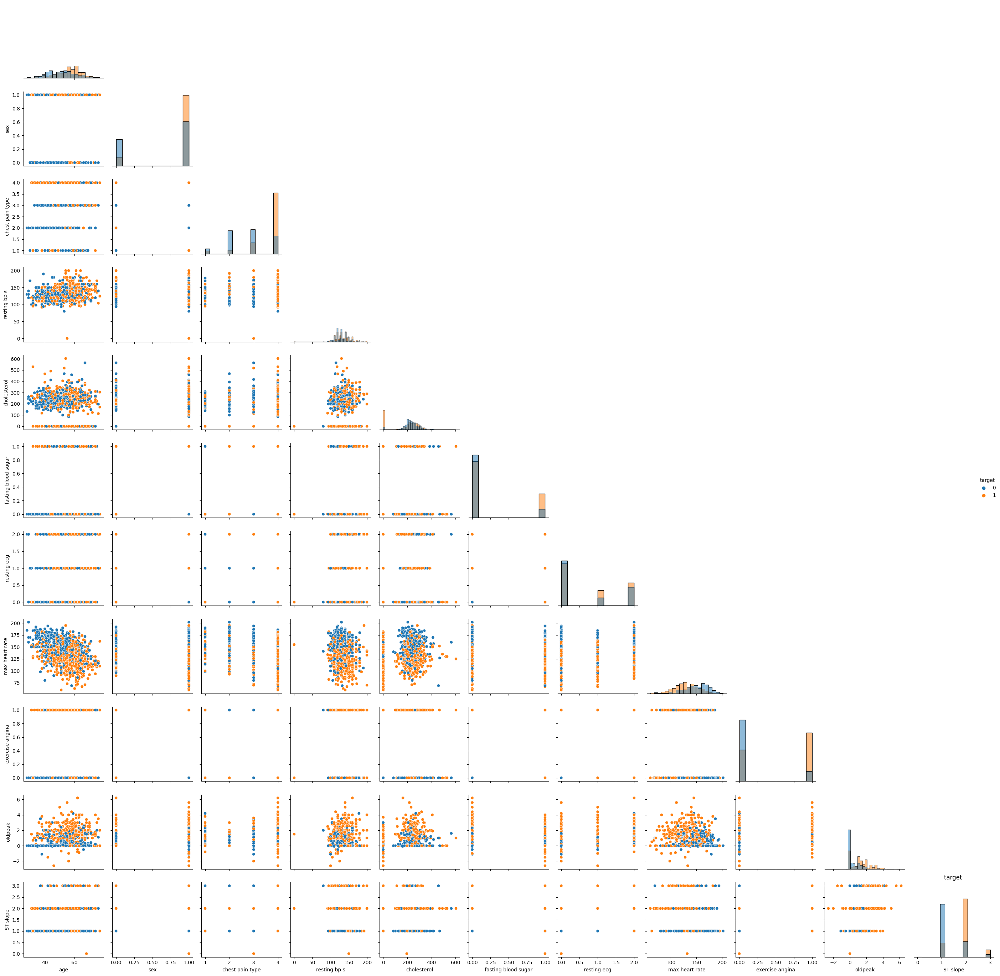

In [17]:
plt.figure(figsize=(10, 10))
for i, feature in enumerate(data.columns):
    sns.pairplot(data=data,hue='target',corner=True,diag_kind='hist')
    plt.title(f'{feature} ')
    plt.xlabel(' ')
    plt.ylabel(feature)
plt.tight_layout()

plt.show();

In [18]:
# Select only numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Compute correlation matrix
corr_matrix = numeric_data.corr()

# Show correlation with target only
corr_with_target = corr_matrix['target'].sort_values(ascending=False)
print(corr_with_target)

target                 1.000000
ST slope               0.505608
exercise angina        0.481467
chest pain type        0.460127
oldpeak                0.398385
sex                    0.311267
age                    0.262029
fasting blood sugar    0.216695
resting bp s           0.121415
resting ecg            0.073059
cholesterol           -0.198366
max heart rate        -0.413278
Name: target, dtype: float64


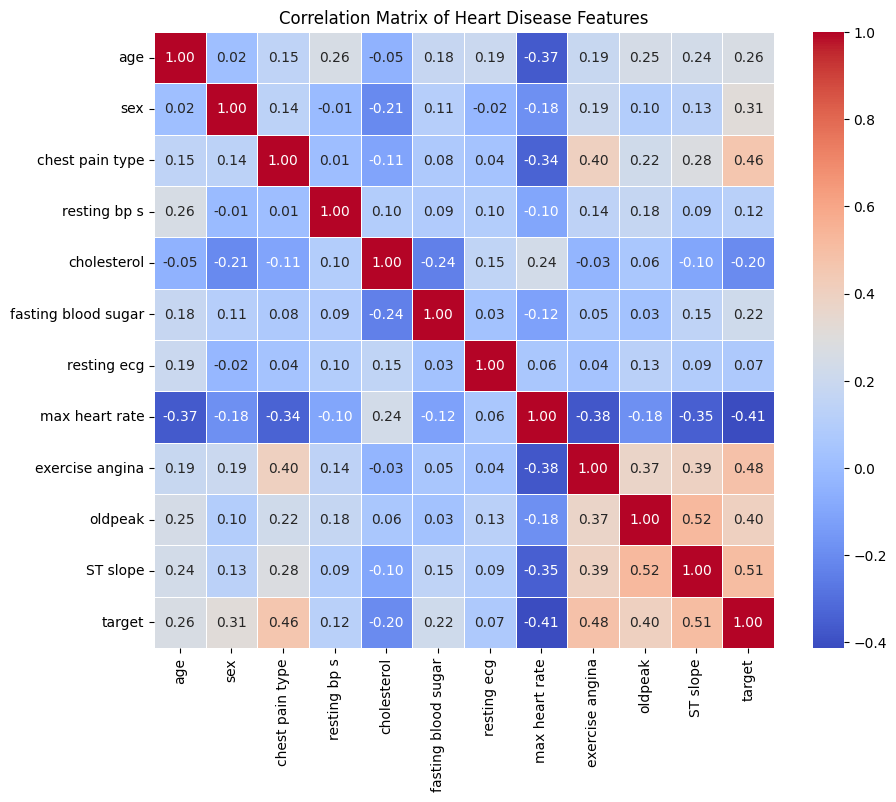

In [19]:
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Heart Disease Features')
plt.show()

In [20]:
X = data.drop('target', axis=1)
y = data['target']

In [21]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)
print(X_train.shape)
print(X_test.shape)

(952, 11)
(238, 11)


In [22]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [23]:
model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train, y_train)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,42
,solver,'lbfgs'
,max_iter,1000
,multi_class,'deprecated'


In [24]:
y_pred = model.predict(X_test)

In [25]:
lr_accuracy_score = accuracy_score(y_test, y_pred)
print("✅ Accuracy:", round(lr_accuracy_score, 3))
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

✅ Accuracy: 0.84

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.82      0.83       112
           1       0.84      0.86      0.85       126

    accuracy                           0.84       238
   macro avg       0.84      0.84      0.84       238
weighted avg       0.84      0.84      0.84       238



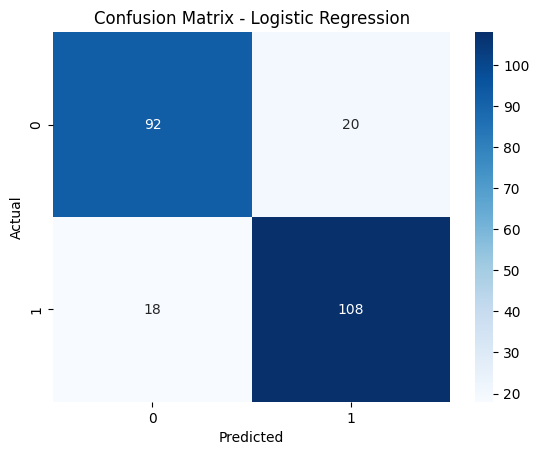

In [26]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

In [27]:
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [28]:
y_pred = model.predict(X_test)

In [29]:
rf_accuracy_score = accuracy_score(y_test, y_pred)
print("Accuracy:", rf_accuracy_score)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.9285714285714286

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.92      0.92       112
           1       0.93      0.94      0.93       126

    accuracy                           0.93       238
   macro avg       0.93      0.93      0.93       238
weighted avg       0.93      0.93      0.93       238



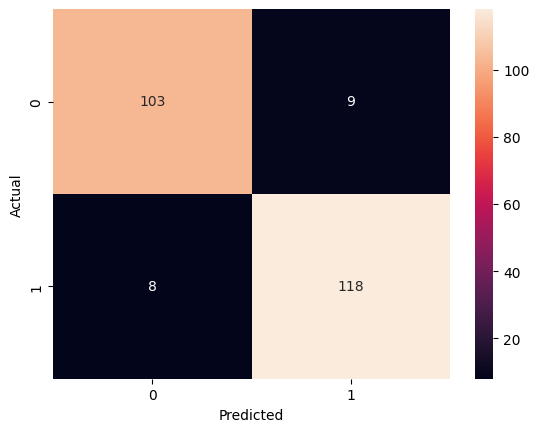

In [30]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [62]:
model = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42,
    eval_metric='logloss'
)
model.fit(X_train, y_train)

,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'logloss'


In [63]:
y_pred = model.predict(X_test)

In [64]:
xgb_accuracy_score = accuracy_score(y_test, y_pred)
print("✅ Accuracy:", round(xgb_accuracy_score, 3))
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

✅ Accuracy: 0.92

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.92      0.92       112
           1       0.93      0.92      0.92       126

    accuracy                           0.92       238
   macro avg       0.92      0.92      0.92       238
weighted avg       0.92      0.92      0.92       238



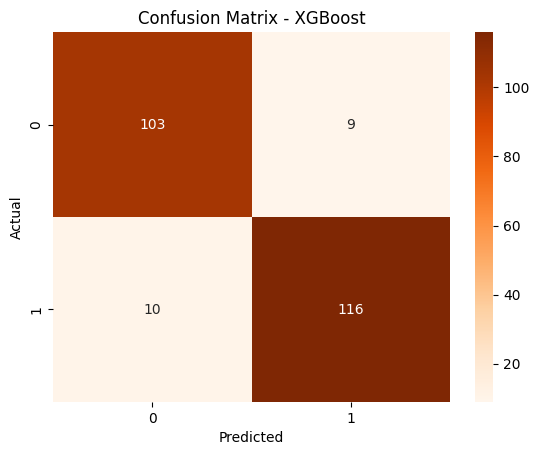

In [65]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Oranges')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

In [66]:
model = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
model.fit(X_train, y_train)

,C,1.0
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


In [67]:
y_pred = model.predict(X_test)

In [68]:
svc_accuracy_score = accuracy_score(y_test, y_pred)
print("✅ Accuracy:", round(svc_accuracy_score, 3))
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

✅ Accuracy: 0.878

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.84      0.87       112
           1       0.86      0.91      0.89       126

    accuracy                           0.88       238
   macro avg       0.88      0.88      0.88       238
weighted avg       0.88      0.88      0.88       238



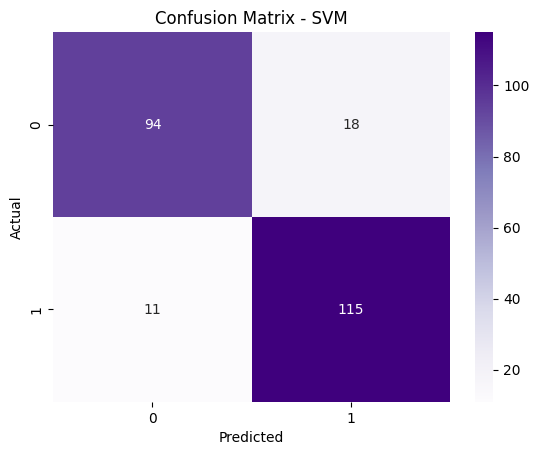

In [69]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Purples')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

In [70]:
model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_train, y_train)

,n_neighbors,5
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [71]:
y_pred = model.predict(X_test)

In [72]:
knn_accuracy_score = accuracy_score(y_test, y_pred)
print("✅ Accuracy:", round(knn_accuracy_score, 3))
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

✅ Accuracy: 0.836

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.79      0.82       112
           1       0.83      0.87      0.85       126

    accuracy                           0.84       238
   macro avg       0.84      0.83      0.83       238
weighted avg       0.84      0.84      0.84       238



Text(0.5, 1.0, 'Confusion Matrix - KNN')

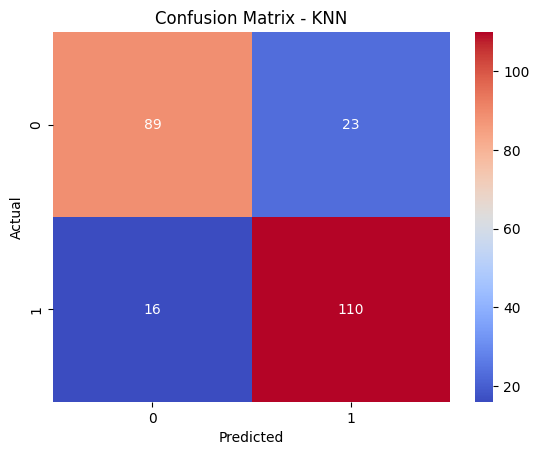

In [73]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='coolwarm')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")

In [74]:
model_ev = pd.DataFrame({
    'Model': ['Logistic Regression','Random Forest','Extreme Gradient Boost',
               'Support Vector Machine','K-Nearest Neighbour'],
    'Accuracy (%)': [lr_accuracy_score*100, rf_accuracy_score*100, xgb_accuracy_score*100,
                     svc_accuracy_score*100, knn_accuracy_score*100]
})

model_ev


,Model,Accuracy (%)
0,Logistic Regression,84.033613
1,Random Forest,92.857143
2,Extreme Gradient Boost,92.016807
3,Support Vector Machine,87.815126
4,K-Nearest Neighbour,83.613445


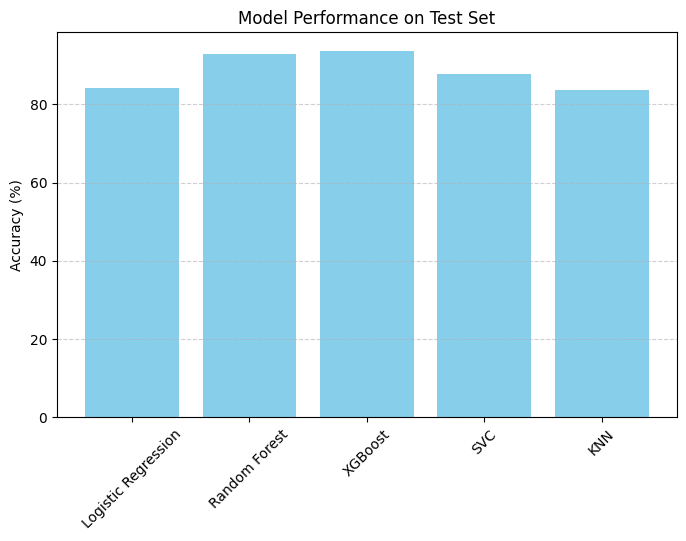

In [75]:
# Train models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    "SVC": SVC(),
    "KNN": KNeighborsClassifier()
}

accuracies = {}

# Train and evaluate
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracies[name] = acc * 100  # in percentage

# Plot accuracy graph
plt.figure(figsize=(8,5))
plt.bar(accuracies.keys(), accuracies.values(), color='skyblue')
plt.title("Model Performance on Test Set")
plt.ylabel("Accuracy (%)")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()


In [79]:
from sklearn.ensemble import VotingClassifier

# Define base models
models = [
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('Random Forest', RandomForestClassifier()),
    ('XGB', model),
    ('SVC', SVC(probability=True)),
    ('KNN', KNeighborsClassifier())
]

# Create ensemble model (soft voting)
ensemble_model = VotingClassifier(estimators=models, voting='soft')

# Train ensemble
ensemble_model.fit(X_train, y_train)

# Evaluate ensemble
y_pred = ensemble_model.predict(X_test)


In [80]:
ensemble_accuracy_score = accuracy_score(y_test, y_pred)
print("✅ Ensemble Model Accuracy:", round(ensemble_accuracy_score * 100, 2), "%")
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

✅ Ensemble Model Accuracy: 88.66 %

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.86      0.88       112
           1       0.88      0.91      0.89       126

    accuracy                           0.89       238
   macro avg       0.89      0.88      0.89       238
weighted avg       0.89      0.89      0.89       238



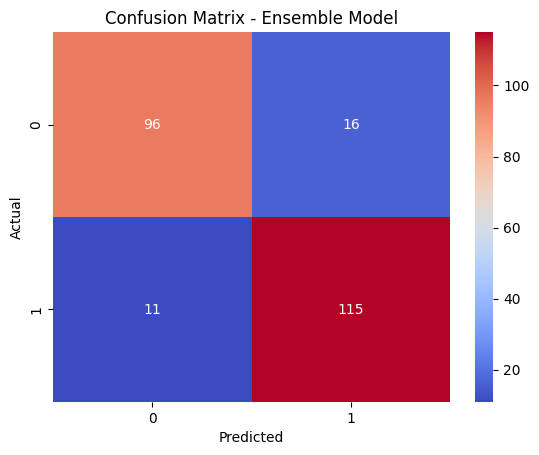

In [81]:
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='coolwarm')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Ensemble Model")
plt.show()

In [82]:
import joblib

# Save the ensemble model
joblib.dump(ensemble_model, "ensemble_heart_disease_model.pkl")
joblib.dump(scaler, "scaler.pkl")
print("✅ Ensemble model saved successfully as 'ensemble_heart_disease_model.pkl'")


✅ Ensemble model saved successfully as 'ensemble_heart_disease_model.pkl'
